In [8]:
pip install gymnasium Box2D

# Base

Run this part before each training to reset the network.

In [9]:
import gymnasium as gym
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import random
from collections import deque
import matplotlib.pyplot as plt


# Environment setup
env = gym.make("LunarLander-v3")
state_dim = env.observation_space.shape[0]
action_dim = env.action_space.n

## classic DQN

In [13]:
BATCH_SIZE = 64
GAMMA = 0.99
EPS_START = 1.0
EPS_END = 1e-02
EPS_DECAY = 0.9995
TARGET_UPDATE = 10
MEMORY_SIZE = 10000
LEARNING_RATE = 1e-3
NUM_EPISODES = 200

In [14]:
class DQN(nn.Module):
    def __init__(self, state_dim, action_dim):
        super(DQN, self).__init__()
        self.fc1 = nn.Linear(state_dim, 128)
        self.fc2 = nn.Linear(128, 128)
        self.fc3 = nn.Linear(128, 64)
        self.fc4 = nn.Linear(64, action_dim)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = torch.relu(self.fc3(x))
        return self.fc4(x)

In [15]:
class DQNAgent:
    def __init__(self, state_dim, action_dim):
        self.policy_net = DQN(state_dim, action_dim)
        self.target_net = DQN(state_dim, action_dim)
        self.target_net.load_state_dict(self.policy_net.state_dict())
        self.target_net.eval()

        self.optimizer = optim.Adam(self.policy_net.parameters(), lr=LEARNING_RATE)
        self.memory = deque(maxlen=MEMORY_SIZE)
        self.eps = EPS_START
        self.steps_done = 0

    def select_action(self, state):
        sample = random.random()
        if sample > self.eps:
            with torch.no_grad():
                return self.policy_net(state).max(1)[1].view(1, 1)
        else:
            return torch.tensor([[random.randrange(action_dim)]], dtype=torch.long)

    def store_transition(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def update_epsilon(self):
        self.eps = max(EPS_END, self.eps * EPS_DECAY)

    def train(self):
        if len(self.memory) < BATCH_SIZE:
            return

        batch = random.sample(self.memory, BATCH_SIZE)
        states, actions, rewards, next_states, dones = zip(*batch)

        states = torch.cat(states)
        actions = torch.cat(actions)
        rewards = torch.cat(rewards)
        next_states = torch.cat(next_states)
        dones = torch.cat(dones)

        current_q = self.policy_net(states).gather(1, actions)
        next_q = self.target_net(next_states).max(1)[0].detach()
        expected_q = rewards + (1 - dones) * GAMMA * next_q

        loss = nn.MSELoss()(current_q, expected_q.unsqueeze(1))

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

    def update_target_network(self):
        self.target_net.load_state_dict(self.policy_net.state_dict())

In [16]:
agent = DQNAgent(state_dim, action_dim)
episode_rewards = []

for episode in range(NUM_EPISODES):
    state, _ = env.reset()
    state = torch.tensor(state, dtype=torch.float32).unsqueeze(0)
    total_reward = 0
    done = False

    while not done:
        action = agent.select_action(state)
        next_state, reward, terminated, truncated, _ = env.step(action.item())
        done = terminated or truncated
        next_state = torch.tensor(next_state, dtype=torch.float32).unsqueeze(0)
        reward = torch.tensor([reward], dtype=torch.float32)
        done = torch.tensor([done], dtype=torch.float32)

        agent.store_transition(state, action, reward, next_state, done)
        state = next_state
        total_reward += reward.item()

        agent.train()
        agent.update_epsilon()

    if episode % TARGET_UPDATE == 0:
        agent.update_target_network()

    episode_rewards.append(total_reward)
    print(f"Episode {episode}, Reward: {total_reward}, Epsilon: {agent.eps}")

    # Early stopping if solved
    if len(episode_rewards) >= 100 and np.mean(episode_rewards[-100:]) >= 200:
        print("Environment solved!")
        break

env.close()

Episode 0, Reward: -365.99560875818133, Epsilon: 0.9445806045085049
Episode 1, Reward: -86.20653618872166, Epsilon: 0.8962576207922821
Episode 2, Reward: -117.59742644429207, Epsilon: 0.8628306102460106
Episode 3, Reward: -335.4222607649863, Epsilon: 0.81419825010847
Episode 4, Reward: -215.35102247446775, Epsilon: 0.7771957568656473
Episode 5, Reward: -82.38564131781459, Epsilon: 0.7355941230642932
Episode 6, Reward: -47.68470496684313, Epsilon: 0.7049789010996835
Episode 7, Reward: -56.66921154386364, Epsilon: 0.6619249094002023
Episode 8, Reward: -363.99384784698486, Epsilon: 0.6252414310604806
Episode 9, Reward: -175.43444718047976, Epsilon: 0.5947406098585333
Episode 10, Reward: -99.65649234503508, Epsilon: 0.5386686338853831
Episode 11, Reward: -116.52971963956952, Epsilon: 0.5083072550853868
Episode 12, Reward: -107.63067898573354, Epsilon: 0.48254447526744126
Episode 13, Reward: -277.1232529031113, Epsilon: 0.44166468408295473
Episode 14, Reward: -294.17311170336325, Epsilon: 0

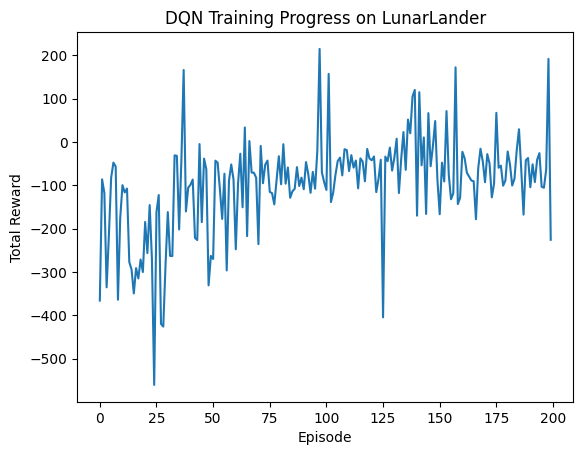

In [17]:
plt.plot(episode_rewards)
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.title('DQN Training Progress on LunarLander')
plt.show()

In [22]:
import imageio

def evaluate(agent, episodes=1, render=True, save_gif=True, gif_name="dqn_eval.gif"):
    agent.policy_net.eval()
    rewards = []

    #  ساخت محیط داخل تابع با render_mode
    env = gym.make("LunarLander-v3", render_mode="rgb_array")
    frames = []

    for ep in range(episodes):
        state, _ = env.reset()
        state = torch.tensor(state, dtype=torch.float32).unsqueeze(0)
        total_reward = 0
        done = False

        while not done:
            with torch.no_grad():
                action = agent.policy_net(state).max(1)[1].view(1, 1)
            next_state, reward, terminated, truncated, _ = env.step(action.item())
            done = terminated or truncated
            next_state = torch.tensor(next_state, dtype=torch.float32).unsqueeze(0)
            state = next_state
            total_reward += reward

            if render or save_gif:
                frame = env.render()
                frames.append(frame)

        print(f"Evaluation Episode {ep + 1}, Total Reward: {total_reward}")
        rewards.append(total_reward)

    env.close()

    if save_gif and frames:
        imageio.mimsave(gif_name, frames, fps=30)
        print(f" GIF saved as {gif_name}")

    avg_reward = np.mean(rewards)
    print(f"\nAverage Evaluation Reward over {episodes} episodes: {avg_reward:.2f}")
    return rewards



In [24]:
evaluate(agent, episodes=1, render=False, save_gif=True, gif_name="classic_dqn.gif")


Evaluation Episode 1, Total Reward: -132.69055566912283
✅ GIF saved as classic_dqn.gif

Average Evaluation Reward over 1 episodes: -132.69


[np.float64(-132.69055566912283)]

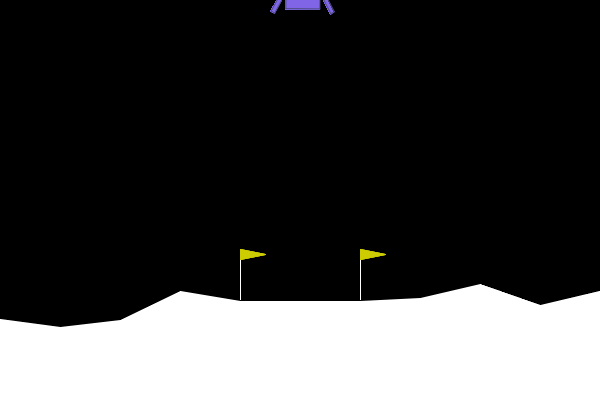

In [38]:
from IPython.display import Image

Image(filename='classic_dqn.gif')



## Double DQN

In [35]:
BATCH_SIZE = 64
GAMMA = 0.99
EPS_START = 1.0
EPS_END = 1e-02
EPS_DECAY = 0.9995
TARGET_UPDATE = 10
MEMORY_SIZE = 10000
LEARNING_RATE = 1e-4
NUM_EPISODES = 300

In [36]:

class DDQNAgent:
    def __init__(self, state_dim, action_dim):
        self.policy_net = DQN(state_dim, action_dim)
        self.target_net = DQN(state_dim, action_dim)
        self.target_net.load_state_dict(self.policy_net.state_dict())
        self.target_net.eval()

        self.optimizer = optim.Adam(self.policy_net.parameters(), lr=LEARNING_RATE)
        self.memory = deque(maxlen=MEMORY_SIZE)
        self.eps = EPS_START
        self.steps_done = 0

    def select_action(self, state):
        sample = random.random()
        if sample > self.eps:
            with torch.no_grad():
                return self.policy_net(state).max(1)[1].view(1, 1)
        else:
            return torch.tensor([[random.randrange(action_dim)]], dtype=torch.long)

    def store_transition(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def update_epsilon(self):
        self.eps = max(EPS_END, self.eps * EPS_DECAY)

    def train(self):
        if len(self.memory) < BATCH_SIZE:
            return

        batch = random.sample(self.memory, BATCH_SIZE)
        states, actions, rewards, next_states, dones = zip(*batch)

        states = torch.cat(states)
        actions = torch.cat(actions)
        rewards = torch.cat(rewards)
        next_states = torch.cat(next_states)
        dones = torch.cat(dones)

        current_q = self.policy_net(states).gather(1, actions)

        with torch.no_grad():
          next_actions = self.policy_net(next_states).max(1)[1].unsqueeze(1)

          next_q = self.target_net(next_states).gather(1, next_actions)
          expected_q = rewards + (1 - dones) * GAMMA * next_q.squeeze()

        loss = nn.MSELoss()(current_q, expected_q.unsqueeze(1))

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

    def update_target_network(self):
        self.target_net.load_state_dict(self.policy_net.state_dict())

In [37]:
agent = DDQNAgent(state_dim, action_dim)
episode_rewards = []

for episode in range(NUM_EPISODES):
    state, _ = env.reset()
    state = torch.tensor(state, dtype=torch.float32).unsqueeze(0)
    total_reward = 0
    done = False

    while not done:
        action = agent.select_action(state)
        next_state, reward, terminated, truncated, _ = env.step(action.item())
        done = terminated or truncated
        next_state = torch.tensor(next_state, dtype=torch.float32).unsqueeze(0)
        reward = torch.tensor([reward], dtype=torch.float32)
        done = torch.tensor([done], dtype=torch.float32)

        agent.store_transition(state, action, reward, next_state, done)
        state = next_state
        total_reward += reward.item()

        agent.train()
        agent.update_epsilon()

    if episode % TARGET_UPDATE == 0:
        agent.update_target_network()

    episode_rewards.append(total_reward)
    print(f"Episode {episode}, Reward: {total_reward}, Epsilon: {agent.eps}")

    # Early stopping if solved
    if len(episode_rewards) >= 100 and np.mean(episode_rewards[-100:]) >= 200:
        print("Environment solved!")
        break

env.close()

Episode 0, Reward: -85.72827332653105, Epsilon: 0.9583802792808146
Episode 1, Reward: -142.84678692463785, Epsilon: 0.9249463838986807
Episode 2, Reward: -187.57213935814798, Epsilon: 0.8785061368352669
Episode 3, Reward: -111.97056522965431, Epsilon: 0.8265063812989984
Episode 4, Reward: -177.08589071780443, Epsilon: 0.7768071589872145
Episode 5, Reward: -418.683347966522, Epsilon: 0.7348587128397597
Episode 6, Reward: -293.09117397572845, Epsilon: 0.7014619270413868
Episode 7, Reward: -21.684249341487885, Epsilon: 0.6632504156875374
Episode 8, Reward: -158.08338257297873, Epsilon: 0.6202582131590649
Episode 9, Reward: -208.51196576282382, Epsilon: 0.5867635833127822
Episode 10, Reward: -471.92349232616834, Epsilon: 0.5443558822611947
Episode 11, Reward: -174.75657405727543, Epsilon: 0.5067842382020455
Episode 12, Reward: -123.50120330043137, Epsilon: 0.46640977369184183
Episode 13, Reward: -317.76257569529116, Epsilon: 0.41739659257742384
Episode 14, Reward: -210.82075922377408, Epsi

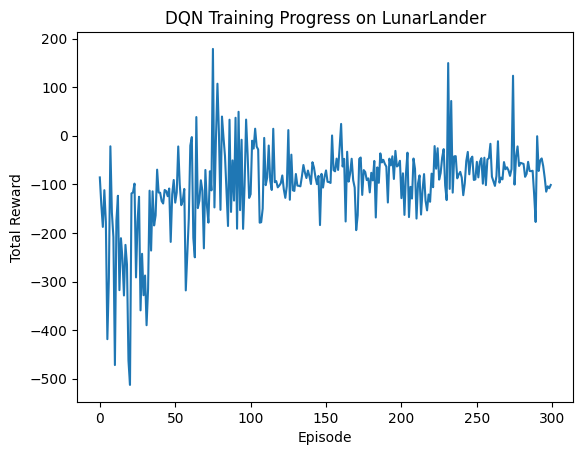

In [39]:
plt.plot(episode_rewards)
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.title('DQN Training Progress on LunarLander')
plt.show()

In [40]:
eval_env = gym.make("LunarLander-v3", render_mode="rgb_array")


In [41]:
import imageio

def evaluate(agent, episodes=1, gif_name="ddqn.gif"):
    frames = []
    rewards = []
    agent.policy_net.eval()

    for ep in range(episodes):
        state, _ = eval_env.reset()
        state = torch.tensor(state, dtype=torch.float32).unsqueeze(0)
        total_reward = 0
        done = False

        while not done:
            with torch.no_grad():
                action = agent.policy_net(state).max(1)[1].view(1, 1)
            next_state, reward, terminated, truncated, _ = eval_env.step(action.item())
            done = terminated or truncated
            state = torch.tensor(next_state, dtype=torch.float32).unsqueeze(0)
            total_reward += reward

            # ذخیره کردن فریم برای GIF
            frame = eval_env.render()
            frames.append(frame)

        print(f"Evaluation Episode {ep+1}, Total Reward: {total_reward}")
        rewards.append(total_reward)

    # ذخیره GIF
    imageio.mimsave(gif_name, frames, fps=30)
    print(f"✅ GIF saved as {gif_name}")

    print(f"\nAverage Evaluation Reward over {episodes} episodes: {np.mean(rewards):.2f}")
    return rewards


In [42]:
evaluate(agent, episodes=1, gif_name="ddqn.gif")


Evaluation Episode 1, Total Reward: 123.80453748652316
✅ GIF saved as ddqn.gif

Average Evaluation Reward over 1 episodes: 123.80


[np.float64(123.80453748652316)]

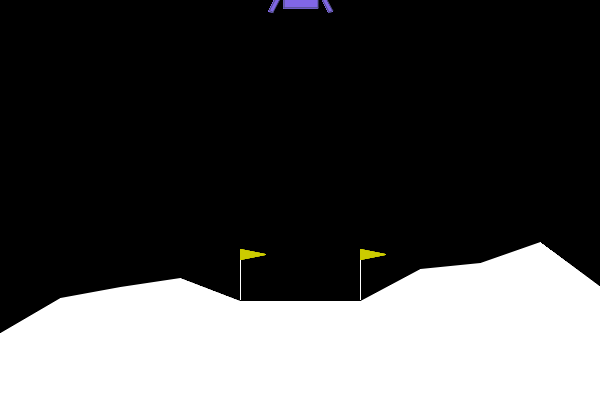

In [46]:
from IPython.display import Image
Image(filename="ddqn.gif")


## Deuling DQN

In [59]:
BATCH_SIZE = 64
GAMMA = 0.99
EPS_START = 1.0
EPS_END = 1e-02
EPS_DECAY = 0.9995
TARGET_UPDATE = 10
MEMORY_SIZE = 10000
LEARNING_RATE = 5e-4
NUM_EPISODES = 350

In [60]:
class DuelingDQNAgent:
    def __init__(self, state_dim, action_dim):
        self.policy_net = DuelingDQN(state_dim, action_dim)
        self.target_net = DuelingDQN(state_dim, action_dim)
        self.target_net.load_state_dict(self.policy_net.state_dict())
        self.target_net.eval()

        self.optimizer = optim.Adam(self.policy_net.parameters(), lr=LEARNING_RATE)
        self.memory = deque(maxlen=MEMORY_SIZE)
        self.eps = EPS_START

    def select_action(self, state):
        if random.random() > self.eps:
            with torch.no_grad():
                return self.policy_net(state).max(1)[1].view(1, 1)
        else:
            return torch.tensor([[random.randrange(action_dim)]], dtype=torch.long)

    def store_transition(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def update_epsilon(self):
        self.eps = max(EPS_END, self.eps * EPS_DECAY)

    def train(self):
        if len(self.memory) < BATCH_SIZE:
            return

        batch = random.sample(self.memory, BATCH_SIZE)
        states, actions, rewards, next_states, dones = zip(*batch)

        states = torch.cat(states)
        actions = torch.cat(actions)
        rewards = torch.cat(rewards)
        next_states = torch.cat(next_states)
        dones = torch.cat(dones)

        current_q = self.policy_net(states).gather(1, actions)

        with torch.no_grad():
            next_q = self.target_net(next_states).max(1)[0]
            expected_q = rewards + (1 - dones) * GAMMA * next_q

        loss = nn.MSELoss()(current_q, expected_q.unsqueeze(1))

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

    def update_target_network(self):
        self.target_net.load_state_dict(self.policy_net.state_dict())


In [61]:
agent = DQNAgent(state_dim, action_dim)
episode_rewards = []

for episode in range(NUM_EPISODES):
    state, _ = env.reset()
    state = torch.tensor(state, dtype=torch.float32).unsqueeze(0)
    total_reward = 0
    done = False

    while not done:
        action = agent.select_action(state)
        next_state, reward, terminated, truncated, _ = env.step(action.item())
        done = terminated or truncated
        next_state = torch.tensor(next_state, dtype=torch.float32).unsqueeze(0)
        reward = torch.tensor([reward], dtype=torch.float32)
        done = torch.tensor([done], dtype=torch.float32)

        agent.store_transition(state, action, reward, next_state, done)
        state = next_state
        total_reward += reward.item()

        agent.train()
        agent.update_epsilon()

    if episode % TARGET_UPDATE == 0:
        agent.update_target_network()

    episode_rewards.append(total_reward)
    print(f"Episode {episode}, Reward: {total_reward}, Epsilon: {agent.eps}")

    # Early stopping if solved
    if len(episode_rewards) >= 100 and np.mean(episode_rewards[-100:]) >= 200:
        print("Environment solved!")
        break

env.close()

Episode 0, Reward: -101.94016170501709, Epsilon: 0.9660800044319772
Episode 1, Reward: -89.52872768417001, Epsilon: 0.9171157093295601
Episode 2, Reward: -161.88013188540936, Epsilon: 0.8873374893756012
Episode 3, Reward: -88.10668475180864, Epsilon: 0.839000572940262
Episode 4, Reward: -162.16944891400635, Epsilon: 0.7932967668135174
Episode 5, Reward: -304.005355283618, Epsilon: 0.7463406486802746
Episode 6, Reward: -135.5769211584702, Epsilon: 0.7174277540217103
Episode 7, Reward: -17.65928341820836, Epsilon: 0.6639141638728693
Episode 8, Reward: -51.158233009278774, Epsilon: 0.6346931260969424
Episode 9, Reward: -134.29526720521972, Epsilon: 0.5977225069731926
Episode 10, Reward: -321.5154113192111, Epsilon: 0.5465382131697586
Episode 11, Reward: -94.43356974143535, Epsilon: 0.525628387480894
Episode 12, Reward: -189.0813762638718, Epsilon: 0.4952583746690321
Episode 13, Reward: -233.19788400549442, Epsilon: 0.4429919999699293
Episode 14, Reward: -252.24400480743498, Epsilon: 0.418

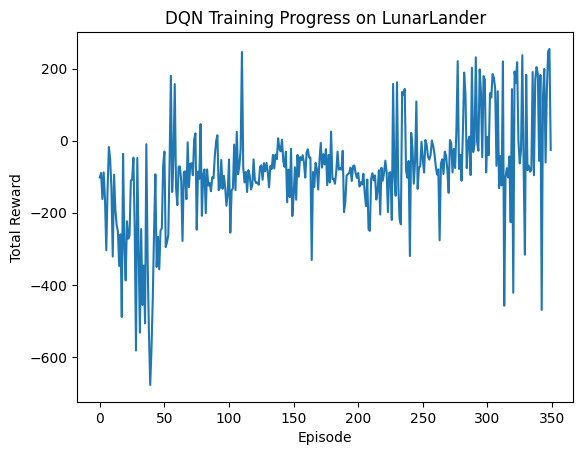

In [62]:
plt.plot(episode_rewards)
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.title('DQN Training Progress on LunarLander')
plt.show()

In [63]:
import imageio

def evaluate(agent, episodes=1, gif_filename="dueling_dqn.gif"):
    env = gym.make("LunarLander-v3", render_mode="rgb_array")
    frames = []
    rewards = []

    for ep in range(episodes):
        state, _ = env.reset()
        state = torch.tensor(state, dtype=torch.float32).unsqueeze(0)
        total_reward = 0
        done = False

        while not done:
            frame = env.render()
            frames.append(frame)

            with torch.no_grad():
                action = agent.policy_net(state).max(1)[1].view(1, 1)
            next_state, reward, terminated, truncated, _ = env.step(action.item())
            done = terminated or truncated

            state = torch.tensor(next_state, dtype=torch.float32).unsqueeze(0)
            total_reward += reward

        rewards.append(total_reward)
        print(f"Evaluation Episode {ep + 1}, Total Reward: {total_reward}")

    env.close()

    # Save GIF
    imageio.mimsave(gif_filename, frames, fps=30)
    print(f"✅ GIF saved as {gif_filename}")

    avg = np.mean(rewards)
    print(f"\nAverage Evaluation Reward over {episodes} episodes: {avg:.2f}")
    return rewards


In [64]:
evaluate(agent, episodes=1, gif_filename="dueling_dqn.gif")


Evaluation Episode 1, Total Reward: 157.5608252022979
✅ GIF saved as dueling_dqn.gif

Average Evaluation Reward over 1 episodes: 157.56


[np.float64(157.5608252022979)]

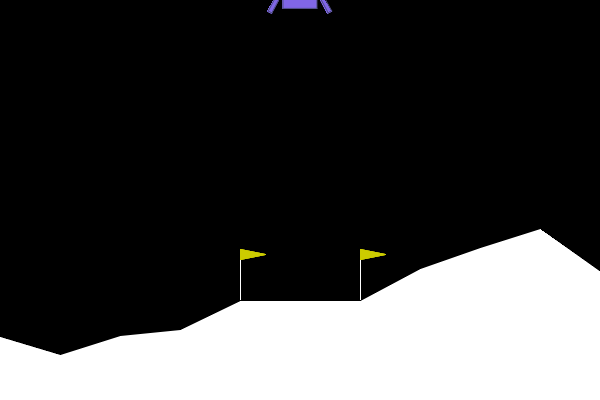

In [67]:
from IPython.display import Image, display
display(Image(filename="dueling_dqn.gif"))




## Dueling Double DQN


In [17]:
BATCH_SIZE = 64
GAMMA = 0.99
EPS_START = 1.0
EPS_END = 0.01
EPS_DECAY = 0.999
TARGET_UPDATE = 50
MEMORY_SIZE = 20000
LEARNING_RATE = 5e-5
NUM_EPISODES = 300

In [ ]:
# --- تعریف شبکه عصبی Dueling DQN ---
class DuelingDQN(nn.Module):
    def __init__(self, state_dim, action_dim):
        super(DuelingDQN, self).__init__()
        self.feature = nn.Sequential(
            nn.Linear(state_dim, 128),
            nn.ReLU()
        )
        self.value_stream = nn.Sequential(
            nn.Linear(128, 128),
            nn.ReLU(),
            nn.Linear(128, 1)
        )
        self.advantage_stream = nn.Sequential(
            nn.Linear(128, 128),
            nn.ReLU(),
            nn.Linear(128, action_dim)
        )

    def forward(self, x):
        x = self.feature(x)
        value = self.value_stream(x)
        advantage = self.advantage_stream(x)
        return value + advantage - advantage.mean(dim=1, keepdim=True)

# --- تعریف عامل Dueling Double DQN ---
class DuelingDDQNAgent:
    def __init__(self, state_dim, action_dim):
        self.policy_net = DuelingDQN(state_dim, action_dim)
        self.target_net = DuelingDQN(state_dim, action_dim)
        self.target_net.load_state_dict(self.policy_net.state_dict())
        self.target_net.eval()

        self.optimizer = optim.Adam(self.policy_net.parameters(), lr=LEARNING_RATE)
        self.memory = deque(maxlen=MEMORY_SIZE)
        self.eps = EPS_START

    def select_action(self, state):
        if random.random() > self.eps:
            with torch.no_grad():
                return self.policy_net(state).max(1)[1].view(1, 1)
        else:
            return torch.tensor([[random.randrange(action_dim)]], dtype=torch.long)

    def store_transition(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def update_epsilon(self):
        self.eps = max(EPS_END, self.eps * EPS_DECAY)

    def train(self):
        if len(self.memory) < BATCH_SIZE:
            return

        batch = random.sample(self.memory, BATCH_SIZE)
        states, actions, rewards, next_states, dones = zip(*batch)

        states = torch.cat(states)
        actions = torch.cat(actions)
        rewards = torch.cat(rewards)
        next_states = torch.cat(next_states)
        dones = torch.cat(dones)

        current_q = self.policy_net(states).gather(1, actions)

        with torch.no_grad():
            next_actions = self.policy_net(next_states).max(1)[1].unsqueeze(1)
            next_q = self.target_net(next_states).gather(1, next_actions)
            expected_q = rewards + (1 - dones) * GAMMA * next_q.squeeze()

        loss = nn.MSELoss()(current_q, expected_q.unsqueeze(1))

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

    def update_target_network(self):
        self.target_net.load_state_dict(self.policy_net.state_dict())

# --- آماده‌سازی محیط ---
env = gym.make("LunarLander-v3")
state_dim = env.observation_space.shape[0]
action_dim = env.action_space.n

agent = DuelingDDQNAgent(state_dim, action_dim)
episode_rewards = []

# --- آموزش عامل ---
for episode in range(NUM_EPISODES):
    state, _ = env.reset()
    state = torch.tensor(state, dtype=torch.float32).unsqueeze(0)
    total_reward = 0
    done = False

    while not done:
        action = agent.select_action(state)
        next_state, reward, terminated, truncated, _ = env.step(action.item())
        done = terminated or truncated
        next_state = torch.tensor(next_state, dtype=torch.float32).unsqueeze(0)
        reward = torch.tensor([reward], dtype=torch.float32)
        done_tensor = torch.tensor([done], dtype=torch.float32)

        agent.store_transition(state, action, reward, next_state, done_tensor)
        state = next_state
        total_reward += reward.item()

        agent.train()
        agent.update_epsilon()

    if episode % TARGET_UPDATE == 0:
        agent.update_target_network()

    episode_rewards.append(total_reward)
    print(f"Episode {episode}, Reward: {total_reward:.2f}, Epsilon: {agent.eps:.3f}")

    # بررسی حل محیط
    if len(episode_rewards) >= 50 and np.mean(episode_rewards[-50:]) > 200:
        print("✅ Environment solved early!")
        break

env.close()


Episode 0, Reward: -285.94, Epsilon: 0.914
Episode 1, Reward: -141.52, Epsilon: 0.824
Episode 2, Reward: -128.12, Epsilon: 0.762
Episode 3, Reward: -266.87, Epsilon: 0.691
Episode 4, Reward: -386.08, Epsilon: 0.629
Episode 5, Reward: -39.46, Epsilon: 0.564
Episode 6, Reward: -192.55, Epsilon: 0.461
Episode 7, Reward: -182.92, Epsilon: 0.420
Episode 8, Reward: -335.92, Epsilon: 0.354
Episode 9, Reward: -228.45, Epsilon: 0.324
Episode 10, Reward: -138.00, Epsilon: 0.260
Episode 11, Reward: -234.51, Epsilon: 0.223
Episode 12, Reward: -247.20, Epsilon: 0.197
Episode 13, Reward: -578.66, Epsilon: 0.161
Episode 14, Reward: -83.56, Epsilon: 0.125
Episode 15, Reward: -384.98, Epsilon: 0.099
Episode 16, Reward: -394.63, Epsilon: 0.081
Episode 17, Reward: -254.15, Epsilon: 0.064
Episode 18, Reward: -121.99, Epsilon: 0.054
Episode 19, Reward: -200.26, Epsilon: 0.047
Episode 20, Reward: -215.23, Epsilon: 0.036
Episode 21, Reward: -424.10, Epsilon: 0.029
Episode 22, Reward: -397.45, Epsilon: 0.024


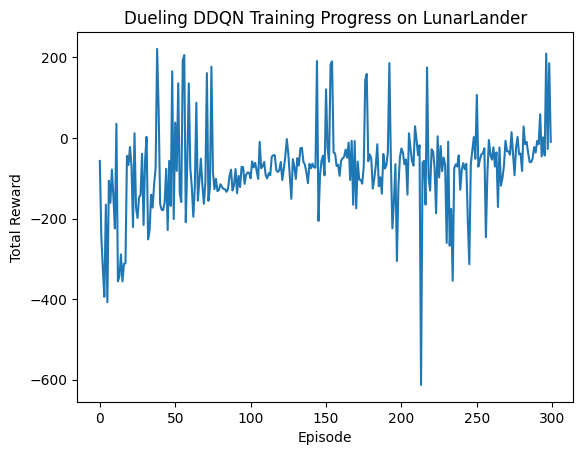

In [15]:
import matplotlib.pyplot as plt

plt.plot(episode_rewards)
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.title('Dueling DDQN Training Progress on LunarLander')
plt.show()


Episode 1, Reward: -23.106238449668368
Episode 2, Reward: 180.67281105904075
Episode 3, Reward: -56.726063840433504
Episode 4, Reward: -56.60622595196373
Episode 5, Reward: -47.89092832647361

🎞️ GIF saved as dueling_ddqn_eval_v3.gif



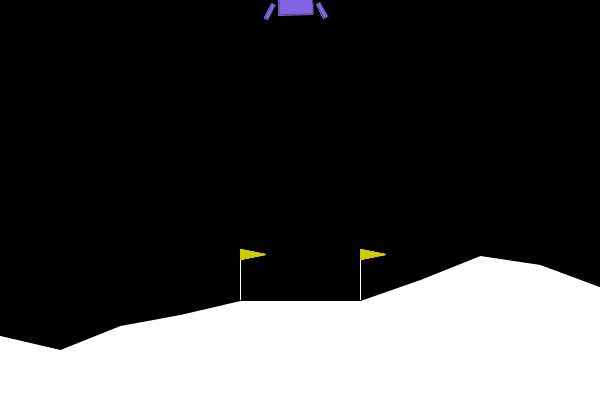


✅ Average reward over 5 evaluation episodes: -0.7313291018996964


In [16]:
import imageio
from IPython.display import display, Image
import numpy as np
import gymnasium as gym  # توجه: gymnasium استفاده شده


eval_env = gym.make("LunarLander-v3", render_mode="rgb_array")

# --- تابع ارزیابی ---
def evaluate(agent, env, episodes=5, gif_filename="evaluation.gif"):
    frames = []
    total_rewards = []

    for episode in range(episodes):
        state, _ = env.reset()
        state = torch.tensor(state, dtype=torch.float32).unsqueeze(0)
        total_reward = 0
        done = False

        while not done:
            action = agent.select_action(state)
            next_state, reward, terminated, truncated, _ = env.step(action.item())
            done = terminated or truncated
            next_state = torch.tensor(next_state, dtype=torch.float32).unsqueeze(0)

            total_reward += reward
            state = next_state

            # ذخیره فریم برای ساخت GIF
            frame = env.render()
            frames.append(frame)

        total_rewards.append(total_reward)
        print(f"Episode {episode+1}, Reward: {total_reward}")

    # ساخت فایل GIF
    imageio.mimsave(gif_filename, frames, duration=0.05)
    print(f"\n🎞️ GIF saved as {gif_filename}\n")

    # نمایش GIF در Colab
    display(Image(filename=gif_filename))

    # میانگین پاداش
    avg_reward = np.mean(total_rewards)
    return avg_reward

# --- اجرای ارزیابی ---
gif_filename = "dueling_ddqn_eval_v3.gif"
avg_reward = evaluate(agent, eval_env, episodes=5, gif_filename=gif_filename)
print(f"\n✅ Average reward over 5 evaluation episodes: {avg_reward}")
